In [1]:
import sys
import librosa as lr
import librosa.display as lrd
import numpy as np

import matplotlib.pyplot as plt
import IPython.display as ipd

%matplotlib inline

sys.path.append("../libs/")
from processing import make_fragments, unmake_fragments, s_to_power, power_to_s

import glob
import os.path as osp

In [2]:
def P2R(radii, angles=None):
    if angles is None:
        angles = np.zeros_like(radii)
    return radii * np.exp(1j*angles)

def R2P(x):
    return np.abs(x), np.angle(x)

def path_to_index(path):
    file = osp.basename(path)
    name = osp.splitext(file)[0]
    return int(name.split('_')[1])

In [7]:
n_fft = 512
win = n_fft
hop = 128
frag_hop = 16
frag_win = 32
print(win, hop, frag_win, frag_hop)

512 128 32 16


In [19]:
files = glob.glob('/data/riccardo_datasets/npr_news/train/cache_c07abf/newscast220831/pink_noise_20_none//s_to_power/frag_*')
files.sort(key=path_to_index)

In [20]:
original, sr = lr.load('/data/riccardo_datasets/npr_news/train/newscast220831.wav', sr=None)
s = lr.stft(original, n_fft=n_fft, hop_length=hop, win_length=win)
_, phase = R2P(s)

In [21]:
tot_duration = 0
data = np.load(files[0])
frags = np.zeros((len(files), *data.shape))
for i, file in enumerate(files):
    frags[i] = np.load(file)
    #print(file, duration)
    #print(data.shape)
print(frags.shape)

(2187, 256, 32, 1)


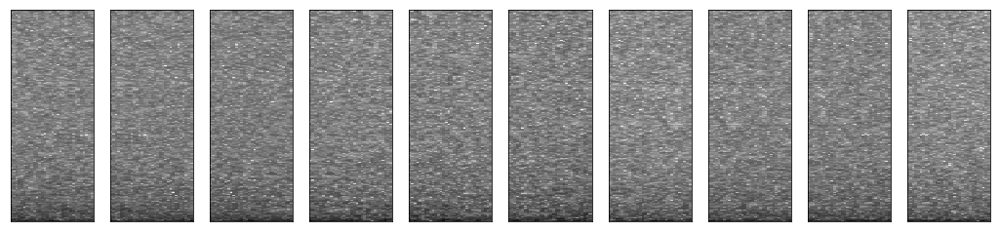

In [22]:
plt.figure(figsize=(18, 4))
offs = 100
n = 10
for i in range(n):
    plt.subplot(1,n,1+i)
    lrd.specshow(lr.power_to_db(np.abs(frags[offs+i,...,0])), cmap='gray_r')
    # ipd.Audio(x, rate=sr)

In [23]:
s_power_sig = unmake_fragments(frags, frag_hop_len=frag_hop, frag_win_len=frag_win)

s_sig_abs = power_to_s(np.abs(s_power_sig))
s_sig_len = s_sig_abs.shape[1]
s_sig = P2R(s_sig_abs, phase)
print(s_sig.shape)
sig = lr.istft(s_sig, hop_length=hop, win_length=win)

(257, 35008)


(257, 35008)


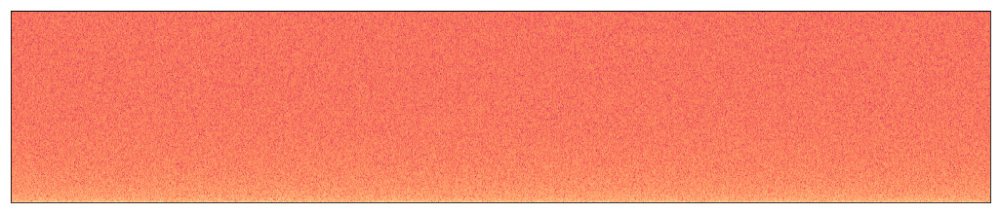

In [24]:
plt.figure(figsize=(18, 8))
plt.subplot(211)
print(s_sig.shape)
lrd.specshow(lr.power_to_db(np.abs(s_sig)))
ipd.Audio(sig, rate=sr)

In [17]:
print(s_power_sig.min(), s_power_sig.max())

4.0978882071517064e-13 4428.80322265625


In [18]:
for f in files:
    #print(f)
    pass